# Analysis of random undersampling

This notebook analyses the effect of **random undersampling** the majority class on the performance of tree-based ensembles for imbalanced classification, across 37 datasets.

We compare 6 baseline models trained on the original (imbalanced) datasets — Random Forest (`rf`), AdaBoost (`ada`), Gradient Boosting (`gbm`), CatBoost (`cat`), LightGBM (`lgbm`) and XGBoost (`xgb`) — against the same models trained on data undersampled so that there are equal number of majority and minority observations. All models were tuned with hyperparameter search; results are averaged over cross-validation folds.

Contents:

1. **Training speed** — training time (including hyperparameter search) with and without undersampling.
2. **Performance comparison** — ROC-AUC, average precision, recall, F1, MCC, balanced accuracy and Brier score, each with a Friedman test per dataset and Nemenyi post-hoc tests where the Friedman test is significant.

In [1]:
import sys
sys.path.insert(1, '../')

In [2]:
import joblib
import pickle

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from functions.data import load_dataset
from functions.data import DATASETS_LS as datasets
from functions.analysis import create_df, create_fold_df
from functions.statistical_tests import apply_friedman_test, apply_nemenyi_test
from functions.plotting import compute_ylim, add_significance_bars


In [3]:
import warnings
warnings.filterwarnings("ignore", message="X does not have valid feature names")
warnings.filterwarnings("ignore", message="The total space of parameters")
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)


## Load results

In [4]:
# baseline ensembles, no resampling (notebook 01-analysis-of-ensembles)
with open('../models/ensembles/results', 'rb') as f:
    scores_baseline = pickle.load(f)

with open('../models/ensembles/results_folds', 'rb') as f:
    folds_baseline = pickle.load(f)

# same ensembles trained after Random Undersampling (RUS)
with open('../models/rus/results', 'rb') as f:
    scores_rus = pickle.load(f)

with open('../models/rus/results_folds', 'rb') as f:
    folds_rus = pickle.load(f)

# combine baseline and RUS results into a single comparison
scores_dict = {
    dataset: {**scores_baseline[dataset], **scores_rus[dataset]}
    for dataset in scores_baseline
}

folds_dict = {
    dataset: {**folds_baseline[dataset], **folds_rus[dataset]}
    for dataset in folds_baseline
}


In [5]:
with open('../models/rus/sampling_stats', 'rb') as f:
    sampling_stats = pickle.load(f)

# Typo in the dataset name used during RUS training: the dataset was saved as
# 'sencom' instead of 'secom'. Remap here so the rest of the notebook is consistent.
if 'sencom' in sampling_stats and 'secom' not in sampling_stats:
    sampling_stats['secom'] = sampling_stats.pop('sencom')

In [6]:
# baseline models first, then their RUS counterparts — makes the left/right
# split in the plots easy to interpret at a glance
models = [
    "rf", "ada", "gbm", "cat", "lgbm", "xgb",
    "rf_rus", "ada_rus", "gbm_rus", "cat_rus", "lgbm_rus", "xgb_rus",
]

MODEL_DIRS = {}
for base in ['rf', 'ada', 'gbm', 'cat', 'lgbm', 'xgb']:
    MODEL_DIRS[base] = "../models/ensembles"
    MODEL_DIRS[f"{base}_rus"] = "../models/rus"

In [7]:
# test function
df = create_df(scores_dict, "oil", models)
df

,roc,roc_std,ap,ap_std,precision,precision_std,recall,recall_std,f1_score,f1_std,mcc,mcc_std,ba,ba_std,brier,brier_std,gmean,gmean_std,thresh,tresh_std
rf,0.954913,0.022165,0.611664,0.097060,0.722500,0.161924,0.703788,0.122399,0.687619,0.041360,0.682910,0.044886,0.926913,0.033283,0.037129,0.011183,0.926353,0.033319,0.206481,0.038896
ada,0.975267,0.006724,0.712369,0.103320,0.811111,0.118374,0.712121,0.038030,0.755938,0.067371,0.749647,0.071642,0.957554,0.003664,0.167357,0.002936,0.956605,0.003832,0.493193,0.011129
gbm,0.970079,0.006198,0.709911,0.093447,0.854978,0.125407,0.646717,0.063174,0.732781,0.074312,0.728965,0.082739,0.944409,0.012350,0.030416,0.007570,0.942680,0.013109,0.647669,0.387881
cat,0.965166,0.003736,0.729943,0.057918,0.852137,0.169602,0.696717,0.108716,0.746032,0.072392,0.748130,0.074906,0.933012,0.011904,0.027421,0.008653,0.931585,0.011854,0.541895,0.301408
lgbm,0.938354,0.018582,0.689647,0.083522,0.845238,0.140052,0.688384,0.079673,0.748779,0.067107,0.744900,0.074590,0.917043,0.023256,0.029256,0.011446,0.914585,0.026115,0.438034,0.367620
xgb,0.964190,0.010220,0.613956,0.101991,0.656439,0.060317,0.719192,0.112405,0.680555,0.070376,0.666395,0.067906,0.936410,0.013476,0.032438,0.010095,0.934136,0.014503,0.277016,0.164331
rf_rus,0.944803,0.010928,0.551554,0.108511,0.741667,0.152550,0.613384,0.084294,0.658627,0.063301,0.650831,0.069504,0.909732,0.020872,0.124997,0.001475,0.905663,0.022640,0.827555,0.010644
ada_rus,0.927986,0.016555,0.432637,0.132232,0.474328,0.136384,0.724747,0.181256,0.542117,0.099532,0.543324,0.085465,0.885728,0.034158,0.185929,0.002116,0.883081,0.034701,0.567387,0.030090
gbm_rus,0.928989,0.006749,0.507389,0.066423,0.653968,0.117782,0.543687,0.060298,0.582272,0.028049,0.573266,0.031329,0.905218,0.012997,0.159772,0.015929,0.900125,0.014535,0.999995,0.000006
cat_rus,0.961260,0.012297,0.659462,0.130793,0.795513,0.128083,0.627273,0.123687,0.688321,0.076718,0.685394,0.076924,0.923856,0.023331,0.113572,0.011983,0.920364,0.025309,0.994087,0.004321


## Datasets

In [8]:
len(datasets)

37

## Probability distribution

For each dataset, we compare the predicted probability of the positive class for
each of the 6 ensembles trained without resampling (**top row** of each pair)
against the same ensembles trained after Random Undersampling (**bottom row**,
labelled `RUS`). Undersampling shifts the decision boundary towards the minority
class, so we expect the RUS row to show probabilities pushed further away from 0
for the same observations.

In [9]:
# For each dataset: row 1 = baseline (no resampling), row 2 = RUS.
# Figure height is intentionally large (2 rows per dataset x 37 datasets),
# so we save at a modest dpi to keep the file size manageable.
n_datasets = len(datasets)
n_estimators = len(['rf', 'ada', 'gbm', 'cat', 'lgbm', 'xgb'])

fig, axes = plt.subplots(2 * n_datasets, n_estimators,
                         figsize=(4 * n_estimators, 3 * 2 * n_datasets))

for i, dataset in enumerate(datasets):
    _, X_test, _, y_test = load_dataset(dataset)

    for j, estimator in enumerate(['rf', 'ada', 'gbm', 'cat', 'lgbm', 'xgb']):
        for row_offset, model in enumerate([estimator, f"{estimator}_rus"]):
            search = joblib.load(f"{MODEL_DIRS[model]}/{dataset}_{model}.pkl")
            probs = search.predict_proba(X_test)[:, 1]

            ax = axes[2 * i + row_offset, j]
            ax.hist(probs, bins=30, density=True, color="steelblue")
            ax.set_xlim(0, 1)
            stats_text = (
                f"min={probs.min():.2f}\n"
                f"max={probs.max():.2f}\n"
                f"mean={probs.mean():.2f}\n"
                f"p75={np.percentile(probs, 75):.2f}\n"
                f"p25={np.percentile(probs, 25):.2f}"
            )
            ax.text(0.97, 0.97, stats_text,
                    transform=ax.transAxes,
                    fontsize=7,
                    verticalalignment="top",
                    horizontalalignment="right",
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="white", edgecolor="gray", alpha=0.8))
            ax.set_title(f"{dataset}\n{model}", fontsize=9)

            if j == 0:
                ax.set_ylabel("Density", fontsize=9)
            if row_offset == 1:
                ax.set_xlabel("P(class = 1)", fontsize=9)

plt.suptitle("Predicted Probability of Class 1: baseline (top) vs RUS (bottom)", fontsize=14, y=1.005)
plt.tight_layout()
plt.savefig('../figures/rus_prob_dist.png', dpi=100, bbox_inches='tight')
plt.show()


As expected, after random undersampling, the probability distributions of the models shift toward higher values.

## Training speed

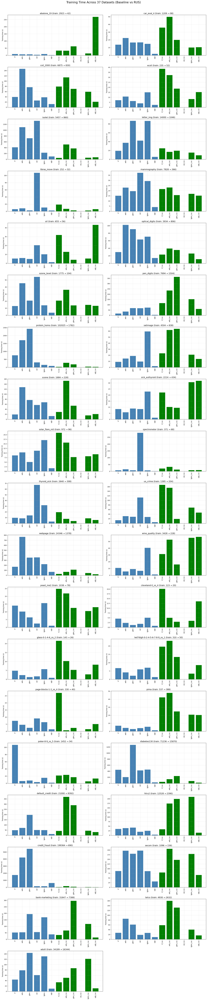

In [10]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

# Loop through each dataset
for i, data in enumerate(datasets):
    ax = axes[i]

    # collect training time (with hyperparameter tuning) per model
    fit_times = []
    for estimator in models:
        search = joblib.load(f"{MODEL_DIRS[estimator]}/{data}_{estimator}.pkl")
        # CatBoost silently drops post-hoc attributes (like fit_time) when
        # pickled, so cat_rus reports NaN here rather than crashing the loop
        fit_times.append(getattr(search, "fit_time", np.nan))

    colors = ["steelblue" if not m.endswith("_rus") else "green" for m in models]
    ax.bar(models, fit_times, color=colors)

    stats = sampling_stats[data]
    ax.set_title(
        f"{data} (train: {stats['original_size']} → {stats['undersampled_size']})",
        fontsize=14,
    )
    ax.set_ylabel("Training time (s)", fontsize=10)
    ax.tick_params(axis='x', rotation=90, labelsize=10)
    ax.grid(True, alpha=0.3)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Training Time Across {len(datasets)} Datasets (Baseline vs RUS)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_training_time.png', dpi=300, bbox_inches='tight')
plt.show()

### Why did training with RUS take longer?

The baseline models are tuned using scikit-learn's `HalvingRandomSearchCV` with `n_jobs=-1`,
which evaluates candidate hyperparameter combinations **in parallel** across all available CPU cores.

The RUS models were tuned with a custom successive-halving loop inside
`train_model_w_undersampling` (see `functions/cv_undersamplers.py`). That loop iterates
over candidates **sequentially** — one at a time, in a plain Python for-loop — so it cannot
exploit parallelism. Each iteration also re-trains on the undersampled folds rather than on
the full training set, adding per-fold overhead on top of the sequential cost.

The net result is that RUS hyperparameter search is substantially slower than the baseline
despite exploring the same parameter grid, purely because of the sequential execution.

**Note**: we updated `functions/cv_undersamplers.py` after seeing this results to train the models in parallel. 

## ROC-AUC Friedman test

In [11]:
friedman_rows = []
nemenyi_dict = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "roc")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict[data] = apply_nemenyi_test(df)

friedman_df = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df

,statistic,pvalue
dataset,,
abalone_19,36.446154,1.426192e-04
car_eval_4,44.261710,6.539291e-06
coil_2000,27.769231,3.511397e-03
ecoli,37.292872,1.029078e-04
isolet,51.738462,3.040523e-07
letter_img,52.228831,2.478139e-07
libras_move,37.896877,8.143403e-05
mammography,32.107692,7.329615e-04
oil,40.097271,3.443026e-05


## Plot ROC-AUC

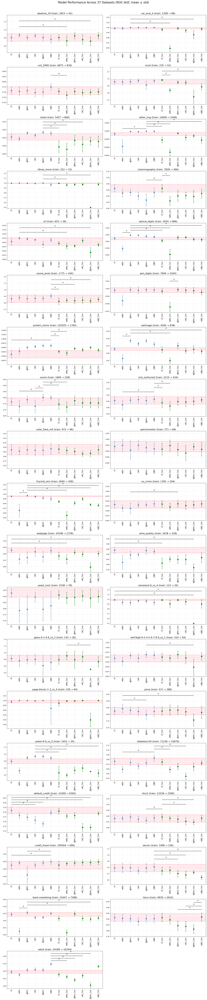

In [12]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

base_models = [m for m in models if not m.endswith("_rus")]
rus_models = [m for m in models if m.endswith("_rus")]

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    # Extract data
    means = df.iloc[:, 0]
    stds = df.iloc[:, 1]

    upper = df.iloc[0, 0] + df.iloc[0, 1]
    lower = df.iloc[0, 0] - df.iloc[0, 1]

    best_model = None
    sig_models = []
    if data in nemenyi_dict:
        best_model = means.idxmax()
        posthoc = nemenyi_dict[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    # Baseline (steelblue) and RUS (green) plotted as separate series
    ax.errorbar(x=base_models, y=means[base_models], yerr=stds[base_models],
                fmt='o', capsize=5, markersize=8, color='steelblue', label='baseline')
    ax.errorbar(x=rus_models, y=means[rus_models], yerr=stds[rus_models],
                fmt='o', capsize=5, markersize=8, color='green', label='RUS')

    stats = sampling_stats[data]
    ax.set_title(
        f"{data} (train: {stats['original_size']} → {stats['undersampled_size']})",
        fontsize=16,
    )
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (ROC-AUC mean ± std)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_rocauc.png', dpi=300, bbox_inches='tight')
plt.show()

### Conclusions ROC-AUC

In all cases, the ensembles without undersampling performed at least equally well, if not better than the variantes trained on undersampled datasets.

## Average Precision Friedman test

In [13]:
friedman_rows = []
nemenyi_dict_ap = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "ap")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_ap[data] = apply_nemenyi_test(df)

friedman_df_ap = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_ap

,statistic,pvalue
dataset,,
abalone_19,38.938462,5.426431e-05
car_eval_4,46.349845,2.804041e-06
coil_2000,25.892308,6.733629e-03
ecoli,28.944484,2.315415e-03
isolet,52.876923,1.890137e-07
letter_img,52.230769,2.476135e-07
libras_move,36.529670,1.381143e-04
mammography,51.000000,4.134337e-07
oil,35.523077,2.030689e-04


## Plot average precision

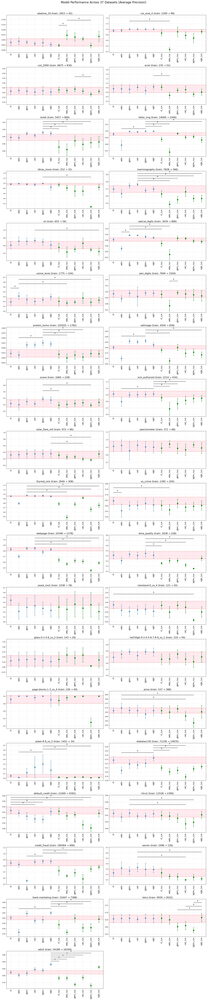

In [14]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

base_models = [m for m in models if not m.endswith("_rus")]
rus_models = [m for m in models if m.endswith("_rus")]

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    means = df.iloc[:, 2]
    stds = df.iloc[:, 3]

    upper = df.iloc[0, 2] + df.iloc[0, 3]
    lower = df.iloc[0, 2] - df.iloc[0, 3]

    best_model = None
    sig_models = []
    if data in nemenyi_dict_ap:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_ap[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=base_models, y=means[base_models], yerr=stds[base_models],
                fmt='o', capsize=5, markersize=8, color='steelblue', label='baseline')
    ax.errorbar(x=rus_models, y=means[rus_models], yerr=stds[rus_models],
                fmt='o', capsize=5, markersize=8, color='green', label='RUS')

    stats = sampling_stats[data]
    ax.set_title(
        f"{data} (train: {stats['original_size']} → {stats['undersampled_size']})",
        fontsize=16,
    )
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average Precision)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_ap.png', dpi=300, bbox_inches='tight')
plt.show()

### Conclusions AP

In all cases, the ensembles without undersampling performed at least equally well, if not better than the variantes trained on undersampled datasets.

## Recall Friedman test

In [15]:
friedman_rows = []
nemenyi_dict_recall = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "recall")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_recall[data] = apply_nemenyi_test(df)

friedman_df_recall = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_recall

,statistic,pvalue
dataset,,
abalone_19,9.921007,0.537506
car_eval_4,12.567757,0.322512
coil_2000,18.666667,0.067346
ecoli,40.032176,0.000035
isolet,44.614134,0.000006
letter_img,42.888808,0.000011
libras_move,22.469246,0.020980
mammography,22.880000,0.018377
oil,20.197295,0.042707


## Plot Recall

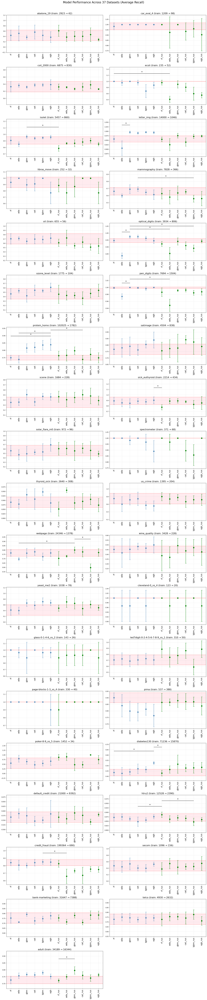

In [16]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

base_models = [m for m in models if not m.endswith("_rus")]
rus_models = [m for m in models if m.endswith("_rus")]

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    means = df.iloc[:, 6]
    stds = df.iloc[:, 7]

    upper = df.iloc[0, 6] + df.iloc[0, 7]
    lower = df.iloc[0, 6] - df.iloc[0, 7]

    best_model = None
    sig_models = []
    if data in nemenyi_dict_recall:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_recall[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=base_models, y=means[base_models], yerr=stds[base_models],
                fmt='o', capsize=5, markersize=8, color='steelblue', label='baseline')
    ax.errorbar(x=rus_models, y=means[rus_models], yerr=stds[rus_models],
                fmt='o', capsize=5, markersize=8, color='green', label='RUS')

    stats = sampling_stats[data]
    ax.set_title(
        f"{data} (train: {stats['original_size']} → {stats['undersampled_size']})",
        fontsize=16,
    )
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Average Recall)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_recall.png', dpi=300, bbox_inches='tight')
plt.show()

### Conclusions Recall

In all cases, the ensembles without undersampling performed at least equally well, if not better than the variantes trained on undersampled datasets.

## F1-score Friedman test

In [17]:
friedman_rows = []
nemenyi_dict_f1 = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "f1")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_f1[data] = apply_nemenyi_test(df)

friedman_df_f1 = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_f1

,statistic,pvalue
dataset,,
abalone_19,34.765242,2.708851e-04
car_eval_4,48.093823,1.373714e-06
coil_2000,33.184745,4.910885e-04
ecoli,27.395007,4.003805e-03
isolet,48.626312,1.103590e-06
letter_img,49.063247,9.217724e-07
libras_move,30.784839,1.191590e-03
mammography,50.073478,6.071855e-07
oil,41.039683,2.372440e-05


## Plot f1-score

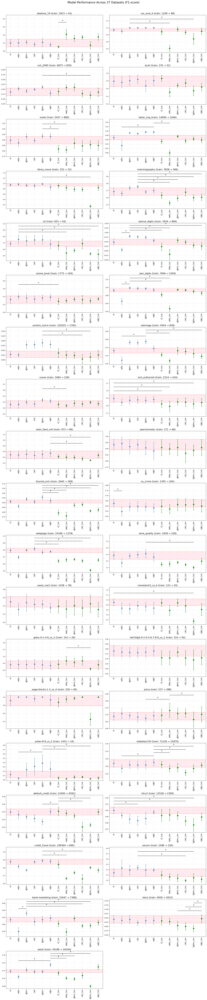

In [18]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

base_models = [m for m in models if not m.endswith("_rus")]
rus_models = [m for m in models if m.endswith("_rus")]

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    means = df.iloc[:, 8]
    stds = df.iloc[:, 9]

    upper = df.iloc[0, 8] + df.iloc[0, 9]
    lower = df.iloc[0, 8] - df.iloc[0, 9]

    best_model = None
    sig_models = []
    if data in nemenyi_dict_f1:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_f1[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=base_models, y=means[base_models], yerr=stds[base_models],
                fmt='o', capsize=5, markersize=8, color='steelblue', label='baseline')
    ax.errorbar(x=rus_models, y=means[rus_models], yerr=stds[rus_models],
                fmt='o', capsize=5, markersize=8, color='green', label='RUS')

    stats = sampling_stats[data]
    ax.set_title(
        f"{data} (train: {stats['original_size']} → {stats['undersampled_size']})",
        fontsize=16,
    )
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (F1-score)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_f1-score.png', dpi=300, bbox_inches='tight')
plt.show()

### Conclusions f1-score

In all cases, the ensembles without undersampling performed at least equally well, if not better than the variantes trained on undersampled datasets.

## MCC Friedman test

In [19]:
friedman_rows = []
nemenyi_dict_mcc = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "mcc")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_mcc[data] = apply_nemenyi_test(df)

friedman_df_mcc = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_mcc

,statistic,pvalue
dataset,,
abalone_19,35.079832,2.403987e-04
car_eval_4,48.093823,1.373714e-06
coil_2000,28.242827,2.971227e-03
ecoli,29.164630,2.140174e-03
isolet,49.426872,7.933235e-07
letter_img,49.063247,9.217724e-07
libras_move,30.744453,1.209271e-03
mammography,49.962185,6.358149e-07
oil,39.171306,4.953753e-05


## Plot MCC

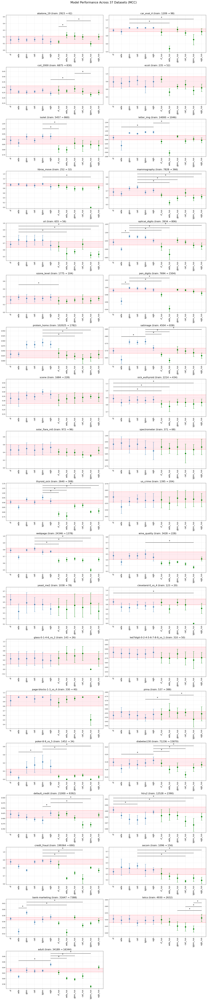

In [20]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

base_models = [m for m in models if not m.endswith("_rus")]
rus_models = [m for m in models if m.endswith("_rus")]

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    means = df.iloc[:, 10]
    stds = df.iloc[:, 11]

    upper = df.iloc[0, 10] + df.iloc[0, 11]
    lower = df.iloc[0, 10] - df.iloc[0, 11]

    best_model = None
    sig_models = []
    if data in nemenyi_dict_mcc:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_mcc[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=base_models, y=means[base_models], yerr=stds[base_models],
                fmt='o', capsize=5, markersize=8, color='steelblue', label='baseline')
    ax.errorbar(x=rus_models, y=means[rus_models], yerr=stds[rus_models],
                fmt='o', capsize=5, markersize=8, color='green', label='RUS')

    stats = sampling_stats[data]
    ax.set_title(
        f"{data} (train: {stats['original_size']} → {stats['undersampled_size']})",
        fontsize=16,
    )
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (MCC)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_mcc.png', dpi=300, bbox_inches='tight')
plt.show()

## Balanced Accuracy Friedman test

In [21]:
friedman_rows = []
nemenyi_dict_ba = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "ba")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_ba[data] = apply_nemenyi_test(df)

friedman_df_ba = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_ba

,statistic,pvalue
dataset,,
abalone_19,34.354794,3.163957e-04
car_eval_4,48.253333,1.286573e-06
coil_2000,29.412876,1.957923e-03
ecoli,41.652487,1.860065e-05
isolet,48.780266,1.035800e-06
letter_img,51.022425,4.095988e-07
libras_move,34.282108,3.251992e-04
mammography,33.430769,4.479003e-04
oil,32.467368,6.415096e-04


## Balanced accuracy

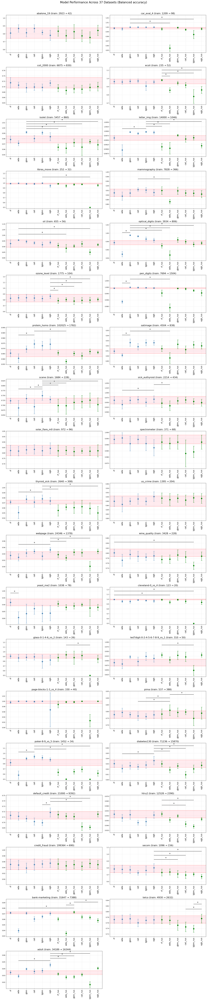

In [22]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

base_models = [m for m in models if not m.endswith("_rus")]
rus_models = [m for m in models if m.endswith("_rus")]

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    means = df.iloc[:, 12]
    stds = df.iloc[:, 13]

    upper = df.iloc[0, 12] + df.iloc[0, 13]
    lower = df.iloc[0, 12] - df.iloc[0, 13]

    best_model = None
    sig_models = []
    if data in nemenyi_dict_ba:
        best_model = means.idxmax()
        posthoc = nemenyi_dict_ba[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=base_models, y=means[base_models], yerr=stds[base_models],
                fmt='o', capsize=5, markersize=8, color='steelblue', label='baseline')
    ax.errorbar(x=rus_models, y=means[rus_models], yerr=stds[rus_models],
                fmt='o', capsize=5, markersize=8, color='green', label='RUS')

    stats = sampling_stats[data]
    ax.set_title(
        f"{data} (train: {stats['original_size']} → {stats['undersampled_size']})",
        fontsize=16,
    )
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Balanced accuracy)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_balanced_acc.png', dpi=300, bbox_inches='tight')
plt.show()

## Brier Score Friedman test

In [23]:
friedman_rows = []
nemenyi_dict_brier = {}

for data in datasets:
    df = create_fold_df(folds_dict, data, "brier")
    statistic, pvalue = apply_friedman_test(df)
    friedman_rows.append({"dataset": data, "statistic": statistic, "pvalue": pvalue})

    # follow up with Nemenyi post-hoc test only when Friedman is significant
    if pvalue < 0.05:
        nemenyi_dict_brier[data] = apply_nemenyi_test(df)

friedman_df_brier = pd.DataFrame(friedman_rows).set_index("dataset")
friedman_df_brier

,statistic,pvalue
dataset,,
abalone_19,54.015385,1.172763e-07
car_eval_4,54.076923,1.142833e-07
coil_2000,51.923077,2.815314e-07
ecoli,50.015385,6.219666e-07
isolet,54.630769,9.053824e-08
letter_img,54.507692,9.535117e-08
libras_move,51.800000,2.963537e-07
mammography,54.446154,9.785197e-08
oil,50.753846,4.579407e-07


## Brier score

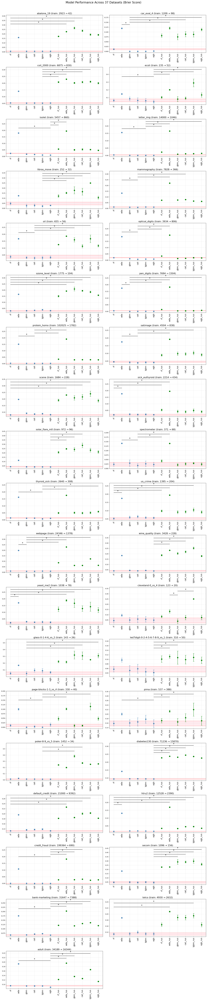

In [24]:
# Create figure with 37 subplots
fig, axes = plt.subplots(nrows=19, ncols=2, figsize=(20, 95))  # 19x2 grid for 37 plots (with 1 empty)
axes = axes.ravel()  # Flatten for easy iteration

base_models = [m for m in models if not m.endswith("_rus")]
rus_models = [m for m in models if m.endswith("_rus")]

# Loop through each DataFrame
for i, data in enumerate(datasets):
    df = create_df(scores_dict, data, models)
    
    ax = axes[i]
    
    means = df.iloc[:, 14]
    stds = df.iloc[:, 15]

    upper = df.iloc[0, 14] + df.iloc[0, 15]
    lower = df.iloc[0, 14] - df.iloc[0, 15]

    best_model = None
    sig_models = []
    if data in nemenyi_dict_brier:
        best_model = means.idxmin()
        posthoc = nemenyi_dict_brier[data]
        sig_models = [
            m for m in models
            if m != best_model and posthoc.loc[best_model, m] < 0.05
        ]

    ax.errorbar(x=base_models, y=means[base_models], yerr=stds[base_models],
                fmt='o', capsize=5, markersize=8, color='steelblue', label='baseline')
    ax.errorbar(x=rus_models, y=means[rus_models], yerr=stds[rus_models],
                fmt='o', capsize=5, markersize=8, color='green', label='RUS')

    stats = sampling_stats[data]
    ax.set_title(
        f"{data} (train: {stats['original_size']} → {stats['undersampled_size']})",
        fontsize=16,
    )
    ylims = compute_ylim(means, stds, upper, lower)
    if sig_models:
        y0, y1 = ylims
        ylims = (y0, y1 + (y1 - y0) * 0.4)
    ax.set_ylim(ylims)
    ax.tick_params(axis='x', rotation=90, labelsize=14)
    ax.grid(True, alpha=0.3)

    ax.axhline(y=upper, color='r', linestyle='--', alpha=0.5)
    ax.axhline(y=lower, color='r', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=lower, ymax=upper, facecolor='pink', alpha=0.3)

    if sig_models:
        data_max = (means + stds).max()
        add_significance_bars(ax, models, data_max, best_model, sig_models)

# Hide unused subplots
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.suptitle(f'Model Performance Across {len(datasets)} Datasets (Brier Score)', fontsize=20, y=1.01)
plt.savefig('../figures/rus_brier.png', dpi=300, bbox_inches='tight')
plt.show()

### Conclusions Brier score

As expected, the Brier score is worse in general for the models with undersampling, because they distort the probability calibration of the models.

# Performance summary table

Mean ± std across all datasets, one row per model. Suitable for inclusion in a research paper.

In [25]:
metric_cols = ["roc", "ap", "f1_score", "mcc", "ba", "brier"]
std_cols = ["roc_std", "ap_std", "f1_std", "mcc_std", "ba_std", "brier_std"]

rows = []
for data in datasets:
    df = create_df(scores_dict, data, models)
    rows.append(df[metric_cols + std_cols])

all_data = pd.concat(rows)
grouped = all_data.groupby(all_data.index)

result = pd.DataFrame(index=models)
for metric, std in zip(metric_cols, std_cols):
    mean_vals = grouped[metric].mean()
    std_vals = grouped[std].mean()
    col_name = metric.replace("_score", "")
    result[col_name] = (
        mean_vals.round(3).astype(str) + " ± " + std_vals.round(3).astype(str)
    )

result.index.name = "model"
result.to_csv('../results/rus_models_performance.csv')
result

,roc,ap,f1,mcc,ba,brier
model,,,,,,
rf,0.914 ± 0.021,0.652 ± 0.055,0.672 ± 0.053,0.654 ± 0.053,0.888 ± 0.019,0.042 ± 0.006
ada,0.895 ± 0.025,0.626 ± 0.062,0.646 ± 0.055,0.624 ± 0.055,0.872 ± 0.021,0.154 ± 0.002
gbm,0.91 ± 0.023,0.65 ± 0.059,0.678 ± 0.055,0.661 ± 0.054,0.889 ± 0.018,0.042 ± 0.007
cat,0.913 ± 0.019,0.664 ± 0.061,0.683 ± 0.054,0.665 ± 0.052,0.889 ± 0.017,0.043 ± 0.007
lgbm,0.905 ± 0.026,0.663 ± 0.059,0.684 ± 0.054,0.663 ± 0.054,0.884 ± 0.02,0.043 ± 0.007
xgb,0.911 ± 0.028,0.652 ± 0.063,0.669 ± 0.056,0.651 ± 0.057,0.887 ± 0.022,0.04 ± 0.006
rf_rus,0.899 ± 0.024,0.616 ± 0.064,0.636 ± 0.054,0.618 ± 0.055,0.878 ± 0.019,0.116 ± 0.006
ada_rus,0.884 ± 0.023,0.551 ± 0.064,0.594 ± 0.057,0.575 ± 0.054,0.862 ± 0.019,0.192 ± 0.003
gbm_rus,0.898 ± 0.026,0.609 ± 0.062,0.643 ± 0.049,0.621 ± 0.05,0.878 ± 0.021,0.129 ± 0.013
